In [4]:
import pandas as pd
import os
import plotly as plt
import plotly.graph_objs as go
import plotly.express as px
import numpy as np
from plotly.subplots import make_subplots
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib

In [5]:
scenario_dict = {1:"Single Force", 2:"Multiple Force",3:"Rolling",4:"Falling", 5:"Sliding" }
novelty_dict = {1:"Objects", 2:"Agents", 3:"Actions", 4:"Interactions", 5:"Relations", 6:"Environments", 7:"Goals", 8:"Events"}

In [6]:
def get_pass_rate_df(all_data,name):
    novelty_type = []
    index_list = []
    pass_rate = []
    all_data['noveltyType'] = all_data['levelName'].str.split('_').str.get(-3)
    for nt in sorted(all_data['noveltyType'].unique()):  
        nt_data = all_data[(all_data['noveltyType']==nt) & (all_data['LevelStatus']!="Timeup")].reset_index()
        #nt_data = all_data[(all_data['noveltyType']==nt)].reset_index()
        for i in sorted(nt_data['index'].unique()):
            index_status = list(nt_data[nt_data['index']==i]['LevelStatus'])
            novelty_type.append(nt)
            index_list.append(i)
            pass_rate.append(index_status.count('Pass')/len(index_status))
#             if index_status.count('Pass')!= 0:
#                 print(index_status)
#                 print(i,index_status.count('Pass')/len(index_status),index_status.count('Pass'))
            
    df = {'Novelty Type':novelty_type, 'Index':index_list, 'Pass Rate':pass_rate, 'Name':name}
    df = pd.DataFrame(df)
    df['SE'] = np.sqrt((df['Pass Rate']*(1-df['Pass Rate']))/40)
    return df

In [7]:
# load datasets
dqn_offline = pd.read_csv("../evaluationdata/adaptation_datasets/dqn_offline.csv")
dqn_online = pd.read_csv("../evaluationdata/adaptation_datasets/dqn_online.csv")
dqn_adapt = pd.read_csv("../evaluationdata/adaptation_datasets/dqn_v3_adaptation.csv")

relational_offline = pd.read_csv("../evaluationdata/adaptation_datasets/relational_offline.csv")
relational_online = pd.read_csv("../evaluationdata/adaptation_datasets/relational_online.csv")
relational_adapt = pd.read_csv("../evaluationdata/adaptation_datasets/relational_v3_adaptation.csv")

naive_adaptation = pd.read_csv("../evaluationdata/adaptation_datasets/naive_adaptation.csv")

datalab = pd.read_csv("../evaluationdata/adaptation_datasets/datalab.csv")
eagles_wing = pd.read_csv("../evaluationdata/adaptation_datasets/eagles_wing.csv")
pig_shooter = pd.read_csv("../evaluationdata/adaptation_datasets/pig_shooter.csv")
random = pd.read_csv("../evaluationdata/adaptation_datasets/random.csv")

human = pd.read_csv("../evaluationdata/adaptation_datasets/human_summary_data.csv")
human['Name'] = "Human"

In [8]:
# get pass rates
dqn_offline_1 = get_pass_rate_df(dqn_offline, "DQN Offline")
dqn_online_1 = get_pass_rate_df(dqn_online, "DQN Online")
dqn_adapt_1 = get_pass_rate_df(dqn_adapt, "DQN Adapt")

relational_offline_1 = get_pass_rate_df(relational_offline, "Relational Offline")
relational_online_1 = get_pass_rate_df(relational_online, "Relational Online")
relational_adapt_1 = get_pass_rate_df(relational_adapt, "Relational Adapt")

naive_adaptation_1 = get_pass_rate_df(naive_adaptation, "Naive Adapt")

datalab_1 = get_pass_rate_df(datalab, "Datalab")
eagles_wing_1 = get_pass_rate_df(eagles_wing, "Eagle's Wing")
pig_shooter_1 = get_pass_rate_df(pig_shooter, "Pig Shooter")
random_1 = get_pass_rate_df(random, "Random")

In [9]:
agent_col = {"Human":"red", "DQN Offline":"blue", "DQN Online":"cornflowerblue", "DQN Adapt":"skyblue",
            "Relational Offline":"darkgreen", "Relational Online":"olive", "Relational Adapt":"lightgreen",
            "Naive Adapt": "orange", "Datalab": "pink", "Eagle's Wing": "indigo", 
            "Pig Shooter": "mediumpurple", "Random": "gray"}
agent_order = ["Human","DQN Offline","DQN Online","DQN Adapt",
                "Relational Offline","Relational Online","Relational Adapt",
                "Naive Adapt", "Datalab", "Eagle's Wing", "Pig Shooter","Random"]

In [10]:
df = pd.concat([dqn_offline_1,dqn_online_1,dqn_adapt_1,
                relational_offline_1,relational_online_1,relational_adapt_1,
               naive_adaptation_1,datalab_1,eagles_wing_1,pig_shooter_1, random_1])
df['Scenario Index'] = df['Novelty Type'].str.get(-1)
df['Novelty Index'] = df['Novelty Type'].str.get(-3)
df['Scenario'] = [scenario_dict.get(int(s)) for s in df['Novelty Type'].str.get(-1)]
df['Novelty'] = [novelty_dict.get(int(s)) for s in df['Novelty Type'].str.get(-3)]
df

,Novelty Type,Index,Pass Rate,Name,SE,Scenario Index,Novelty Index,Scenario,Novelty
0,010101,-40,1.000,DQN Offline,0.000000,1,1,Single Force,Objects
1,010101,-39,0.500,DQN Offline,0.079057,1,1,Single Force,Objects
2,010101,-38,1.000,DQN Offline,0.000000,1,1,Single Force,Objects
3,010101,-37,0.500,DQN Offline,0.079057,1,1,Single Force,Objects
4,010101,-36,1.000,DQN Offline,0.000000,1,1,Single Force,Objects
...,...,...,...,...,...,...,...,...,...
3158,010805,35,0.025,Random,0.024686,5,8,Sliding,Events
3159,010805,36,0.000,Random,0.000000,5,8,Sliding,Events
3160,010805,37,0.000,Random,0.000000,5,8,Sliding,Events
3161,010805,38,0.000,Random,0.000000,5,8,Sliding,Events


In [11]:
human = human[list(df.columns)] #change human column order
df = pd.concat([df,human])
df = df.reset_index()

### Novelty-Scenario Visualizations

In [12]:
fig = px.line(df, x="Index", y="Pass Rate",color="Name",
              facet_col="Scenario", facet_row = "Novelty", facet_col_wrap= 5, 
              color_discrete_map=agent_col,
             category_orders={"Name":agent_order},
              width=1000, height=900)
fig.update_yaxes(title='',range = [-0.1,1.1])
fig.update_xaxes(title = '',range = [-40,40])
fig['layout']['yaxis21']['title']=' Pass Rate '
fig['layout']['xaxis3']['title']=' Index '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In [13]:
# as in human experiment 
fig = px.line(df, x="Index", y="Pass Rate",color="Name",
              facet_col="Scenario", facet_row = "Novelty", facet_col_wrap= 5, 
              color_discrete_map=agent_col,
              category_orders={"Name":agent_order},
              width=980, height=900)
fig.update_yaxes(title='',range = [-0.1,1.1])
fig.update_xaxes(title = '',range = [-4,3])
fig['layout']['yaxis21']['title']=' Pass Rate '
fig['layout']['xaxis3']['title']=' Index '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In [14]:
#create per scenario and per novelty dfs
df_scenario = df.groupby(['Name','Scenario Index', 'Scenario','Index'])['Pass Rate'].mean().reset_index()
df_novelty = df.groupby(['Name','Novelty Index', 'Novelty','Index'])['Pass Rate'].mean().reset_index()

### Per scenario visualization

In [15]:
fig = px.line(df_scenario, x="Index", y="Pass Rate",color="Name",
              color_discrete_map=agent_col,
              category_orders={"Name":agent_order},
              facet_row="Scenario", width=1000)
fig.update_yaxes(title='',range = [-0.05,1.05])
fig.update_xaxes(title = '',range = [-40,40])
#fig.update_traces(error_y_color="black")
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In [16]:
#compare only in human range
fig = px.line(df_scenario, x="Index", y="Pass Rate",color="Name",
              facet_col="Scenario", width=1000,
             color_discrete_map=agent_col,
              category_orders={"Name":agent_order})
fig.update_yaxes(title='',range = [-0.01,1.01])
fig.update_xaxes(title = '',range = [-4,3])

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

### Per novelty visualization

In [17]:
fig = px.line(df_novelty, x="Index", y="Pass Rate",color="Name",
              facet_col="Novelty", facet_col_wrap= 4,width=1000,
             color_discrete_map=agent_col,
              category_orders={"Name":agent_order})
fig.update_yaxes(title='',range = [-0.02,1.02])
fig.update_xaxes(title = '',range = [-40,40])

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In [15]:
#fig.write_image("nature_publication_charts/Fig_within_event_based_on_avg_pass_rate_submission_2.pdf",width=1000,scale=1)

In [18]:
fig = px.line(df_novelty, x="Index", y="Pass Rate",color="Name",
              facet_col="Novelty", facet_col_wrap= 4,width=1000,
             color_discrete_map=agent_col,
              category_orders={"Name":agent_order})
fig.update_yaxes(title='',range = [-0.02,1.02])
fig.update_xaxes(title = '',range = [-4,3])

fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

### Seaborn plots with standard error 

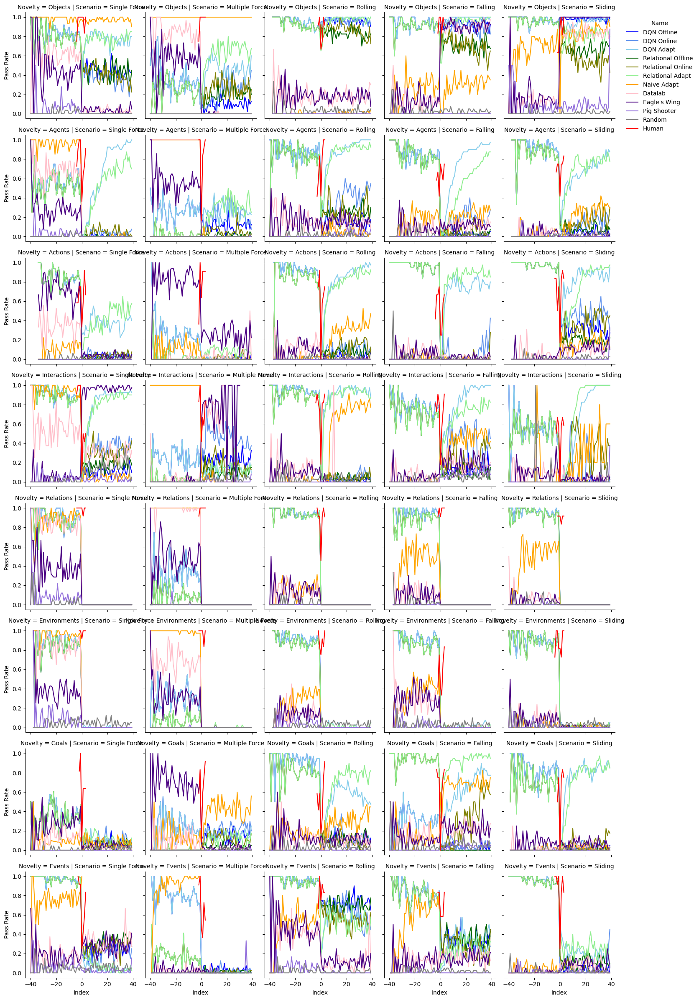

In [19]:
# Per novelty scenario
ax = sns.relplot(
    data=df, x="Index", y="Pass Rate",
    col="Scenario", row= "Novelty",hue="Name",palette=agent_col,
    kind="line",errorbar='se',height=3, aspect=15/15,
)
leg = ax._legend
leg.set_bbox_to_anchor([1,0.92])
# ax = sns.lineplot(x="rho", y="wait_time_mean", hue="c", style="service_type", data=df)
#ax.fill_between(df["Index"], y1=df["Pass Rate"] - df["SE"], y2=df["Pass Rate"] + df["SE"], alpha=.5)

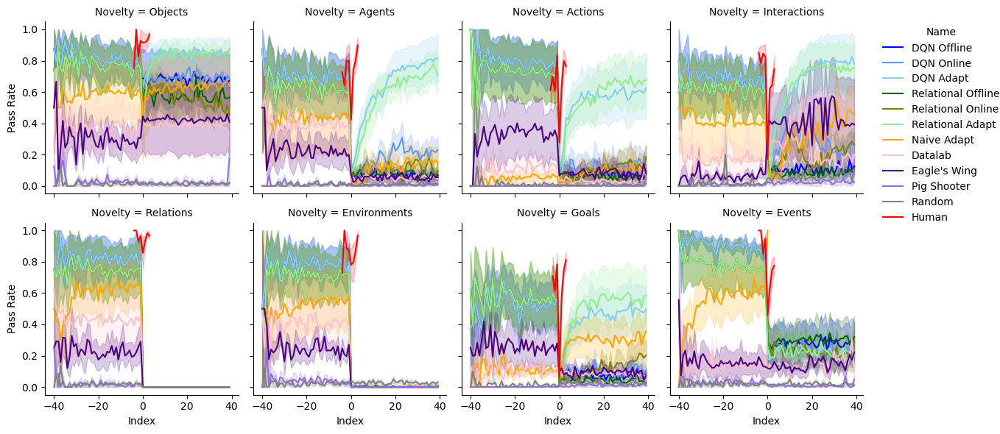

In [20]:
# Per novelty visuals
ax = sns.relplot(
    data=df, x="Index", y="Pass Rate",
    col="Novelty", hue="Name",palette=agent_col,
    kind="line",col_wrap=4,errorbar='se',height=3, aspect=15/15,
)
leg = ax._legend
leg.set_bbox_to_anchor([1,0.70])
#ax.axes[0].set_title('Plot A')

In [21]:
#ax.axes[0]

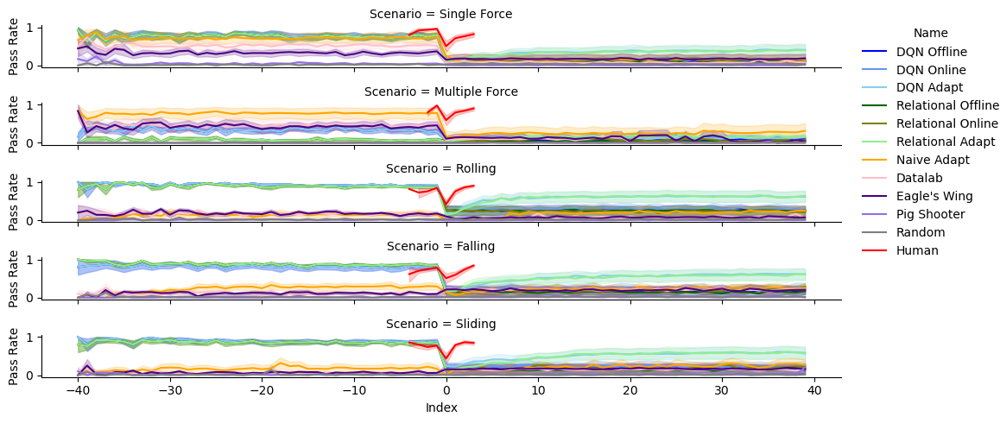

In [22]:
#Per scenario visuals
ax = sns.relplot(
    data=df, x="Index", y="Pass Rate",
    col="Scenario", hue="Name", palette=agent_col,
    kind="line",col_wrap=1,errorbar='se',height=1, aspect=15/1.5,
)
leg = ax._legend
leg.set_bbox_to_anchor([1,0.65])

### Heatmaps

In [23]:
def get_aucs(df,min_val = 0, max_val = 3):
    name_list = []
    novelty_index = []
    scenario_index = []
    pass_rate = []
    for name in df['Name'].unique():
        for nt in df['Novelty'].unique():
            for s in df['Scenario'].unique():
                data = df[(df['Index']>=min_val) & (df['Index']<=max_val) & (df['Novelty']==nt) & (df['Scenario']==s)& (df['Name']==name)]
                #print(data)
                if len(data)>1:
                    auc_val = metrics.auc(data['Index'],data['Pass Rate'])/(max_val-min_val)
                    #auc_val = data['Pass Rate'].sum()/(max_val+1-min_val)
                    #print(auc_val)
                    novelty_index.append(nt)
                    scenario_index.append(s)
                    pass_rate.append(auc_val)
                    name_list.append(name)
                else:
                    novelty_index.append(nt)
                    scenario_index.append(s)
                    pass_rate.append(0)
                    name_list.append(name)

    auc = {"Name":name_list, "Novelty Index":novelty_index, "Scenario Index":scenario_index, "Pass Rate":pass_rate}
    auc = pd.DataFrame(auc)
    return auc

In [24]:
def draw_heatmaps_for_agents(auc,auc_asy,chart_names="all_auc"):
    for name in auc['Name'].unique():
        print("For Agent: ",name)

        auc_filtered = auc[auc['Name']==name]
        auc_asy_filtered = auc_asy[auc_asy['Name']==name]
        
        z1 = np.array(auc_asy_filtered['Pass Rate']).reshape(8,5)
        z2 = np.array(auc_filtered['Pass Rate']).reshape(8,5)
       

        fig = make_subplots(rows=1, cols=2, horizontal_spacing=0.15,
                           subplot_titles=("AP", "AUS"))


        fig.add_trace(px.imshow(z1, text_auto='.2f',
                                x=list(scenario_dict.values()),
                                y= list(novelty_dict.values())).data[0], 1, 1)
        fig.add_trace(px.imshow(z2, text_auto='.2f',
                               x=list(scenario_dict.values()),
                                y= list(novelty_dict.values())).data[0], 1, 2)

        #if you want to use different colorscale for each subplot:

        fig.update_traces(coloraxis='coloraxis1',selector=dict(xaxis='x'))

        fig.update_layout(title_text="",
                          title_x=0.5,
                          yaxis_autorange="reversed",
                          coloraxis=dict(colorscale='amp', 
                                         colorbar_thickness=25,
                                         colorbar_x=-0.20,
                                         cmin=0,cmax=1),
                          yaxis2_autorange="reversed",
                          coloraxis2=dict(colorscale='amp',
                                          colorbar_thickness=25,
                                          ),
                          margin=dict(l=20, r=20, t=20, b=20))
        
        fig.show()
        #fig.write_image("plots/heatmaps_adaptation/"+chart_names+"_"+name+".pdf",width=900,height=400,scale=1)
        #fig.write_image("plots/heatmaps_adaptation/"+chart_names+"_"+name+".png",width=900,height=400,scale=1)

In [25]:
auc = get_aucs(df,min_val = 0, max_val = 3)
auc_asy = get_aucs(df,min_val = 2, max_val = 3)

In [26]:
auc

,Name,Novelty Index,Scenario Index,Pass Rate
0,DQN Offline,Objects,Single Force,0.470833
1,DQN Offline,Objects,Multiple Force,0.045833
2,DQN Offline,Objects,Rolling,0.954167
3,DQN Offline,Objects,Falling,0.916667
4,DQN Offline,Objects,Sliding,0.975000
...,...,...,...,...
475,Human,Events,Single Force,0.513889
476,Human,Events,Multiple Force,0.530303
477,Human,Events,Rolling,0.847222
478,Human,Events,Falling,0.625000


In [27]:
draw_heatmaps_for_agents(auc,auc_asy,chart_names="first_four")

For Agent:  DQN Offline


For Agent:  DQN Online


For Agent:  DQN Adapt


For Agent:  Relational Offline


For Agent:  Relational Online


For Agent:  Relational Adapt


For Agent:  Naive Adapt


For Agent:  Datalab


For Agent:  Eagle's Wing


For Agent:  Pig Shooter


For Agent:  Random


For Agent:  Human


In [28]:
# get auc and auc asy for agents
auc_for_agents = get_aucs(df[df['Name']!="Human"],min_val = 0, max_val = 40)
auc_asy_for_agents = get_aucs(df[df['Name']!="Human"],min_val = 20, max_val = 40)

In [29]:
draw_heatmaps_for_agents(auc_for_agents,auc_asy_for_agents,chart_names="all_novelty")

For Agent:  DQN Offline


For Agent:  DQN Online


For Agent:  DQN Adapt


For Agent:  Relational Offline


For Agent:  Relational Online


For Agent:  Relational Adapt


For Agent:  Naive Adapt


For Agent:  Datalab


For Agent:  Eagle's Wing


For Agent:  Pig Shooter


For Agent:  Random


In [30]:
# get novelty names, scenario names, and agent names
novelty_names = list(novelty_dict.values())
scenario_names = list(scenario_dict.values())
agent_names = list(agent_col.keys())

### Per-Scenario Values

#### AP Values

In [31]:
auc_asy_for_agents_per_scenario = auc_asy_for_agents.groupby(['Name','Scenario Index'], as_index=True).agg(
                      {'Pass Rate':['mean','std']}).reset_index()
auc_asy_for_agents_per_scenario.columns = ['Name','Scenario Index', 'Pass Rate', 'STD']
auc_asy_for_agents_per_scenario.reindex(columns=(auc_asy_for_agents_per_scenario.columns))
auc_asy_for_agents_per_scenario['SE'] = auc_asy_for_agents_per_scenario['STD']/np.sqrt(len(novelty_names))
auc_asy_for_agents_per_scenario = auc_asy_for_agents_per_scenario[auc_asy_for_agents_per_scenario['Name']!="Human"]
#auc_asy_for_agents_per_scenario

In [32]:
#auc_asy_for_agents.groupby(['Name','Scenario Index']).mean()['Pass Rate'].reset_index()

In [33]:
print(auc_asy[auc_asy['Name']=="Human"].groupby(['Scenario Index']).mean())
print(auc_asy[auc_asy['Name']=="Human"].groupby(['Scenario Index']).std()/np.sqrt(len(novelty_names)))

                Pass Rate
Scenario Index           
Falling          0.789773
Multiple Force   0.870265
Rolling          0.883523
Single Force     0.791193
Sliding          0.853220
                Pass Rate
Scenario Index           
Falling          0.047044
Multiple Force   0.047692
Rolling          0.033121
Single Force     0.066185
Sliding          0.040720


In [35]:
fig = px.bar(auc_asy_for_agents_per_scenario, x="Name", y="Pass Rate",color="Name",error_y='SE',
              facet_col="Scenario Index", width=900, height=330,
            color_discrete_map=agent_col,
            category_orders={"Name":agent_order, "Scenario Index":scenario_names}
            )
fig.update_yaxes(title='')
fig.update_xaxes(title = '', ticks='',showticklabels=False)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig['layout']['yaxis1']['title']=' AP '
fig['layout']['xaxis3']['title']=' Agent '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()
#fig.write_image("plots/adaptation_plots/ap_per_scenario.png",width=900,height=330,scale=1)

In [36]:
auc_asy_for_agents_per_scenario['Name'] = pd.Categorical(auc_asy_for_agents_per_scenario['Name'], agent_order)
auc_asy_for_agents_per_scenario = auc_asy_for_agents_per_scenario.sort_values('Name')
auc_asy_for_agents_per_scenario = auc_asy_for_agents_per_scenario.reset_index(drop=True)
#auc_asy_for_agents_per_scenario.to_excel("auc_asy_for_agents_per_scenario.xlsx",index=False)

#### AUS Values

In [37]:
#auc_for_agents.groupby(['Name','Scenario Index']).mean()['Pass Rate'].reset_index()
auc_for_agents_per_scenario = auc_for_agents.groupby(['Name','Scenario Index'], as_index=True).agg(
                      {'Pass Rate':['mean','std']}).reset_index()
auc_for_agents_per_scenario.columns = ['Name','Scenario Index', 'Pass Rate', 'STD']
auc_for_agents_per_scenario.reindex(columns=(auc_for_agents_per_scenario.columns))
auc_for_agents_per_scenario['SE'] = auc_for_agents_per_scenario['STD']/np.sqrt(len(novelty_names))
#auc_for_agents_per_scenario

In [38]:
print(auc[auc['Name']=="Human"].groupby(['Scenario Index']).mean())
print(auc[auc['Name']=="Human"].groupby(['Scenario Index']).std()/np.sqrt(len(novelty_names)))

                Pass Rate
Scenario Index           
Falling          0.671086
Multiple Force   0.794034
Rolling          0.761364
Single Force     0.712279
Sliding          0.763573
                Pass Rate
Scenario Index           
Falling          0.067407
Multiple Force   0.066031
Rolling          0.050565
Single Force     0.080578
Sliding          0.048814


In [39]:
fig = px.bar(auc_for_agents_per_scenario, x="Name", y="Pass Rate",color="Name",error_y='SE',
              facet_col="Scenario Index", width=900, height=330,
            color_discrete_map=agent_col,
            category_orders={"Name":agent_order, "Scenario Index":scenario_names})
fig.update_yaxes(title='')
fig.update_xaxes(title = '', ticks='',showticklabels=False)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig['layout']['yaxis1']['title']=' AUS '
fig['layout']['xaxis3']['title']=' Agent '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()
#fig.write_image("plots/adaptation_plots/aus_per_scenario.png",width=900,height=330,scale=1)

In [40]:
auc_for_agents_per_scenario['Name'] = pd.Categorical(auc_for_agents_per_scenario['Name'], agent_order)
auc_for_agents_per_scenario = auc_for_agents_per_scenario.sort_values('Name')
auc_for_agents_per_scenario = auc_for_agents_per_scenario.reset_index(drop=True)
#auc_for_agents_per_scenario.to_excel("auc_for_agents_per_scenario.xlsx",index=False)

### Per Novelty Values

#### AP Values

In [41]:
#auc_asy_for_agents.groupby(['Name','Novelty Index']).mean()['Pass Rate'].reset_index()
auc_asy_for_agents_per_novelty = auc_asy_for_agents.groupby(['Name','Novelty Index'], as_index=True).agg(
                      {'Pass Rate':['mean','std']}).reset_index()
auc_asy_for_agents_per_novelty.columns = ['Name','Novelty Index', 'Pass Rate', 'STD']
auc_asy_for_agents_per_novelty.reindex(columns=(auc_asy_for_agents_per_novelty.columns))
auc_asy_for_agents_per_novelty['SE'] = auc_asy_for_agents_per_novelty['STD']/np.sqrt(len(scenario_names))
#auc_asy_for_agents_per_novelty

In [42]:
print(auc_asy[auc_asy['Name']=="Human"].groupby(['Novelty Index']).mean())
print(auc_asy[auc_asy['Name']=="Human"].groupby(['Novelty Index']).std()/np.sqrt(len(scenario_names)))

               Pass Rate
Novelty Index           
Actions         0.781818
Agents          0.846970
Environments    0.916667
Events          0.760606
Goals           0.777273
Interactions    0.694697
Objects         0.948485
Relations       0.974242
               Pass Rate
Novelty Index           
Actions         0.052426
Agents          0.060090
Environments    0.045644
Events          0.050272
Goals           0.036439
Interactions    0.072353
Objects         0.016450
Relations       0.016872


In [43]:
fig = px.bar(auc_asy_for_agents_per_novelty, x="Name", y="Pass Rate",color="Name",error_y='SE',
              facet_col="Novelty Index", facet_col_wrap=4, width=900, height=350,
            color_discrete_map=agent_col,
            category_orders={"Name":agent_order, "Novelty Index":novelty_names},)
fig.update_yaxes(title='')
fig.update_xaxes(title = '', ticks='',showticklabels=False)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig['layout']['yaxis1']['title']=' &nbsp;                             &nbsp; AP '
fig['layout']['xaxis2']['title']=' &nbsp;                                  &nbsp; Agent '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()
#fig.write_image("plots/adaptation_plots/ap_per_novelty.png",width=900,height=350,scale=1)

In [44]:
auc_asy_for_agents_per_novelty['Name'] = pd.Categorical(auc_asy_for_agents_per_novelty['Name'], agent_order)
auc_asy_for_agents_per_novelty = auc_asy_for_agents_per_novelty.sort_values('Name')
auc_asy_for_agents_per_novelty = auc_asy_for_agents_per_novelty.reset_index(drop=True)
#auc_asy_for_agents_per_novelty.to_excel("auc_asy_for_agents_per_novelty.xlsx",index=False)

#### AUS Values

In [45]:
auc_for_agents_per_novelty = auc_for_agents.groupby(['Name','Novelty Index'], as_index=True).agg(
                      {'Pass Rate':['mean','std']}).reset_index()
auc_for_agents_per_novelty.columns = ['Name','Novelty Index', 'Pass Rate', 'STD']
auc_for_agents_per_novelty.reindex(columns=(auc_for_agents_per_novelty.columns))
auc_for_agents_per_novelty['SE'] = auc_for_agents_per_novelty['STD']/np.sqrt(len(scenario_names))
#auc_for_agents_per_novelty

In [46]:
print(auc[auc['Name']=="Human"].groupby(['Novelty Index']).mean())
print(auc[auc['Name']=="Human"].groupby(['Novelty Index']).std()/np.sqrt(len(scenario_names)))

               Pass Rate
Novelty Index           
Actions         0.650505
Agents          0.733333
Environments    0.845202
Events          0.661616
Goals           0.586869
Interactions    0.575000
Objects         0.929293
Relations       0.941919
               Pass Rate
Novelty Index           
Actions         0.076095
Agents          0.034971
Environments    0.078694
Events          0.067738
Goals           0.020860
Interactions    0.054794
Objects         0.024486
Relations       0.027455


In [47]:
fig = px.bar(auc_for_agents_per_novelty, x="Name", y="Pass Rate",color="Name",error_y='SE',
              facet_col="Novelty Index", facet_col_wrap=4, width=900, height=350,
            color_discrete_map=agent_col,
            category_orders={"Name":agent_order, "Novelty Index":novelty_names})
fig.update_yaxes(title='')
fig.update_xaxes(title = '', ticks='',showticklabels=False)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig['layout']['yaxis1']['title']='&nbsp;                             &nbsp; AUS '
fig['layout']['xaxis2']['title']=' &nbsp;                                  &nbsp; Agent '
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()
#fig.write_image("plots/adaptation_plots/aus_per_novelty.png",width=900,height=350,scale=1)

In [48]:
auc_for_agents_per_novelty['Name'] = pd.Categorical(auc_for_agents_per_novelty['Name'], agent_order)
auc_for_agents_per_novelty = auc_for_agents_per_novelty.sort_values('Name')
auc_for_agents_per_novelty = auc_for_agents_per_novelty.reset_index(drop=True)
#auc_for_agents_per_novelty.to_excel("auc_for_agents_per_novelty.xlsx",index=False)

In [49]:
auc_for_agents_per_novelty

,Name,Novelty Index,Pass Rate,STD,SE
0,DQN Offline,Actions,0.076313,0.131721,0.058907
1,DQN Offline,Agents,0.064937,0.058965,0.026370
2,DQN Offline,Environments,0.000500,0.001118,0.000500
3,DQN Offline,Events,0.268937,0.278756,0.124664
4,DQN Offline,Goals,0.076500,0.057514,0.025721
...,...,...,...,...,...
83,Random,Events,0.017500,0.020814,0.009308
84,Random,Environments,0.026312,0.016001,0.007156
85,Random,Agents,0.010188,0.007994,0.003575
86,Random,Actions,0.005875,0.004838,0.002164


### Charts with continuous error bars 

In [50]:
def convert_to_rgba(col_name,alpha=0.2):
    rgba_val = list(matplotlib.colors.to_rgba(col_name))
    rgba_val[-1] = alpha
    
    return tuple(rgba_val)

In [51]:
# All data chart

In [52]:
fig = make_subplots(rows=len(novelty_names), cols=len(scenario_names), 
                    column_titles=scenario_names, row_titles=novelty_names,
                   x_title="Index", y_title="Pass Rate")

for nov in novelty_names:
    for sc in scenario_names:
        for a in agent_names:
            #new_col = 
            dff = df[(df['Novelty']==nov) & (df['Scenario']==sc) & (df['Name']==a)].reset_index()
            x = list(dff['Index'])
            y1 = list(dff['Pass Rate'])
            y1_upper = list(dff['Pass Rate'] + dff['SE'])
            y1_lower = list(dff['Pass Rate'] - dff['SE'])
            y1_lower = y1_lower[::-1]
            
            #print(nov, sc, a)
            if len(dff)!=0:
                row_num = int(list(dff['Novelty Index'].unique())[0])
                col_num = int(list(dff['Scenario Index'].unique())[0])
            
            
            if row_num == 1 and col_num == 1:
                showlegend_bool = True
            else:
                showlegend_bool = False
            
            # standard deviation area
            fig.add_trace(go.Scatter(x=x+x[::-1],
                                y=y1_upper+y1_lower,
                                fill='toself',
                                fillcolor='rgba'+str(convert_to_rgba(agent_col[a],alpha=0.2)),
                                line=dict(color='rgba(255,255,255,0)'),
                                showlegend=False,
                                name = a
                                ),
                          row=row_num, col=col_num)
            
            # line trace
            fig.add_trace(go.Scatter(x=x,
                              y=y1,
                              line=dict(color=agent_col[a]),
                              mode='lines',
                              name = a,
                              showlegend=showlegend_bool,
                              ),
                            row=row_num, col=col_num)
            

fig.update_layout(height=900, width=1000,
                  legend=dict(title="Name"),
                 margin=dict(l=20, r=20, t=20, b=20))
fig.update_annotations(font_size=14)
fig.update_yaxes(title='',range = [-0.1,1.1])
fig.update_xaxes(title = '',range = [-40,40])
fig.show()